In [22]:
# Import modules #
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import numpy as np

In [23]:
# Open data #
dataset=Dataset("/Users/leyla/Documents/Education/Imperial/MSc Environmental Technology/Research project/Coastal vulnerability/Data/Wind and wave/KNMI-GLO-WIND_L3-OBS_METOP-B_ASCAT_12_ASC_V2_1689245685308.nc",'r')
#print (dataset.variables.keys())
lon=dataset['lon']
lat=dataset['lat']
wind_speed=dataset['wind_speed']
wind_to_dir=dataset['wind_to_dir'] # numpy arrays

In [25]:
print (lon)
print (lat)
print (wind_speed)
print (wind_to_dir)

<class 'netCDF4._netCDF4.Variable'>
float32 lon(lon)
    valid_min: 0.0
    valid_max: 360.0
    standard_name: longitude
    long_name: longitude
    units: degrees_east
    axis: X
    _CoordinateAxisType: Lon
unlimited dimensions: 
current shape = (64,)
filling on, default _FillValue of 9.969209968386869e+36 used
<class 'netCDF4._netCDF4.Variable'>
float32 lat(lat)
    valid_min: -90.0
    valid_max: 90.0
    standard_name: latitude
    long_name: latitude
    units: degrees_north
    axis: Y
    _CoordinateAxisType: Lat
unlimited dimensions: 
current shape = (26,)
filling on, default _FillValue of 9.969209968386869e+36 used
<class 'netCDF4._netCDF4.Variable'>
int16 wind_speed(time, lat, lon)
    _FillValue: -32767
    missing_value: -32767
    valid_min: 0
    valid_max: 5000
    standard_name: wind_speed
    long_name: stress equivalent wind speed at 10 m
    units: m s-1
    scale_factor: 0.01
    add_offset: 0.0
    coordinates: time lat lon 
unlimited dimensions: 
current shape

In [26]:
wind_speed=wind_speed[:]
print (wind_speed.shape)

(2750, 26, 64)


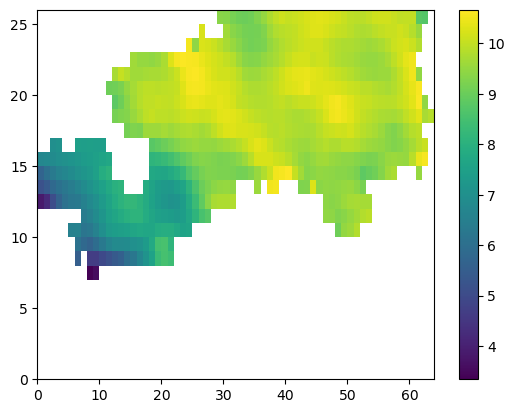

In [27]:
# Plot first day #
plt.pcolormesh(wind_speed[0])
plt.colorbar()
plt.show()

(26, 64)


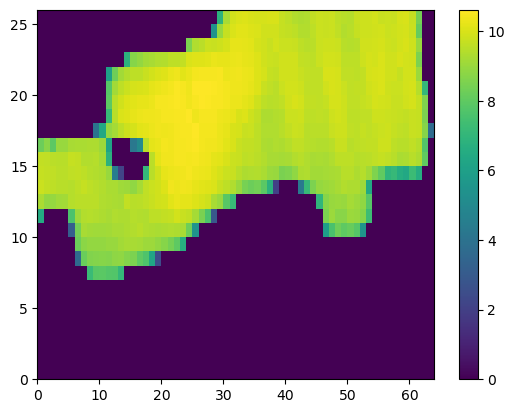

In [28]:
# Calculate 90th percentile #
pc90_ws=np.percentile(wind_speed,q=90,axis=0)
print (pc90_ws.shape)
pc90_ws[pc90_ws<-1E3]=0
plt.pcolormesh(pc90_ws)
plt.colorbar()
plt.show()

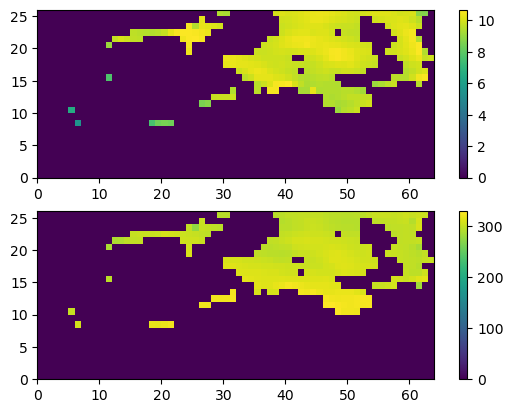

In [29]:
# Extract extreme windn values #
wind_speed_xtrms=np.copy(wind_speed)
wind_speed_xtrms[wind_speed<pc90_ws]=0
wind_to_dir_xtrms=np.copy(wind_to_dir)
wind_to_dir_xtrms[wind_speed<pc90_ws]=0

#wind_speed_xtrms=np.ma.masked_where(wind_speed_xtrms<=0,wind_speed_xtrms)
#wind_to_dir_xtrms=np.ma.masked_where(wind_to_dir_xtrms<=0,wind_to_dir_xtrms)

plt.subplot(211)
plt.pcolormesh(wind_speed_xtrms[0])
plt.colorbar()
plt.subplot(212)
plt.pcolormesh(wind_to_dir_xtrms[0])
plt.colorbar()
plt.show()


In [30]:
# Prepare to export data #
wind_speed_xtrms_flatten=wind_speed_xtrms.flatten()
wind_to_dir_xtrms_flatten=wind_to_dir_xtrms.flatten()
print (wind_speed_xtrms_flatten.shape)
lon_flatten=np.tile(lon,wind_speed.shape[0]*wind_speed.shape[1])
lat_flatten=np.tile(lat,wind_speed.shape[0]*wind_speed.shape[2])
print (lon_flatten.shape)
print (lat_flatten.shape)

(4576000,)
(4576000,)
(4576000,)


In [31]:
# Export data to csv #
header=['lon','lat','wind_speed','wind_to_dir']
file=open('balticsea_extremewinds3.csv', 'w', encoding='UTF8', newline='')
file.write("lon, lat, wind_speed, wind_to_dir \n")
for i in range(wind_speed.size):
    print (100.0*i/wind_speed.size)
    if wind_speed_xtrms_flatten[i]<=0:
        continue
    else:
        file.write("{0}, {1}, {2}, {3} \n".format(lon_flatten[i],lat_flatten[i],wind_speed_xtrms_flatten[i],wind_to_dir_xtrms_flatten[i]))
file.close()

0.0
2.1853146853146853e-05
4.3706293706293706e-05
6.555944055944056e-05
8.741258741258741e-05
0.00010926573426573427
0.00013111888111888112
0.00015297202797202799
0.00017482517482517483
0.0001966783216783217
0.00021853146853146853
0.0002403846153846154
0.00026223776223776224
0.0002840909090909091
0.00030594405594405597
0.0003277972027972028
0.00034965034965034965
0.0003715034965034965
0.0003933566433566434
0.0004152097902097902
0.00043706293706293706
0.0004589160839160839
0.0004807692307692308
0.0005026223776223776
0.0005244755244755245
0.0005463286713286714
0.0005681818181818182
0.000590034965034965
0.0006118881118881119
0.0006337412587412587
0.0006555944055944056
0.0006774475524475524
0.0006993006993006993
0.0007211538461538462
0.000743006993006993
0.0007648601398601399
0.0007867132867132868
0.0008085664335664336
0.0008304195804195804
0.0008522727272727272
0.0008741258741258741
0.000895979020979021
0.0009178321678321678
0.0009396853146853147
0.0009615384615384616
0.000983391608391608

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




22.513701923076923
22.513723776223777
22.51374562937063
22.513767482517483
22.513789335664335
22.51381118881119
22.51383304195804
22.513854895104895
22.513876748251747
22.5138986013986
22.513920454545456
22.513942307692307
22.513964160839162
22.513986013986013
22.514007867132868
22.51402972027972
22.514051573426574
22.514073426573425
22.51409527972028
22.51411713286713
22.514138986013986
22.51416083916084
22.514182692307692
22.514204545454547
22.514226398601398
22.514248251748253
22.514270104895104
22.51429195804196
22.51431381118881
22.514335664335665
22.514357517482516
22.51437937062937
22.514401223776225
22.514423076923077
22.51444493006993
22.514466783216783
22.514488636363637
22.51451048951049
22.514532342657343
22.514554195804195
22.51457604895105
22.5145979020979
22.514619755244755
22.51464160839161
22.51466346153846
22.514685314685316
22.514707167832167
22.514729020979022
22.514750874125873
22.514772727272728
22.51479458041958
22.514816433566434
22.514838286713285
22.514860139

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




45.873776223776225
45.87379807692308
45.87381993006993
45.87384178321678
45.87386363636364
45.87388548951049
45.87390734265734
45.873929195804195
45.87395104895105
45.873972902097904
45.87399475524475
45.87401660839161
45.87403846153846
45.874060314685316
45.87408216783217
45.87410402097902
45.87412587412587
45.87414772727273
45.87416958041958
45.87419143356643
45.874213286713285
45.87423513986014
45.874256993006995
45.87427884615385
45.8743006993007
45.87432255244755
45.87434440559441
45.87436625874126
45.87438811188811
45.874409965034964
45.87443181818182
45.87445367132867
45.87447552447552
45.874497377622376
45.87451923076923
45.874541083916085
45.87456293706294
45.87458479020979
45.87460664335664
45.8746284965035
45.87465034965035
45.8746722027972
45.874694055944055
45.87471590909091
45.874737762237764
45.87475961538462
45.87478146853147
45.87480332167832
45.874825174825176
45.87484702797203
45.87486888111888
45.87489073426573
45.87491258741259
45.87493444055944
45.87495629370629


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




69.35404283216783
69.35406468531468
69.35408653846154
69.35410839160839
69.35413024475524
69.3541520979021
69.35417395104895
69.35419580419581
69.35421765734266
69.3542395104895
69.35426136363637
69.35428321678322
69.35430506993006
69.35432692307693
69.35434877622377
69.35437062937064
69.35439248251748
69.35441433566433
69.35443618881119
69.35445804195804
69.3544798951049
69.35450174825175
69.3545236013986
69.35454545454546
69.3545673076923
69.35458916083915
69.35461101398602
69.35463286713286
69.35465472027973
69.35467657342657
69.35469842657342
69.35472027972028
69.35474213286713
69.35476398601399
69.35478583916084
69.35480769230769
69.35482954545455
69.3548513986014
69.35487325174824
69.3548951048951
69.35491695804195
69.35493881118882
69.35496066433566
69.35498251748251
69.35500437062937
69.35502622377622
69.35504807692308
69.35506993006993
69.35509178321678
69.35511363636364
69.35513548951049
69.35515734265734
69.3551791958042
69.35520104895105
69.3552229020979
69.35524475524475


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




93.10666520979021
93.10668706293707
93.10670891608392
93.10673076923077
93.10675262237763
93.10677447552447
93.10679632867132
93.10681818181818
93.10684003496503
93.1068618881119
93.10688374125874
93.10690559440559
93.10692744755245
93.1069493006993
93.10697115384616
93.10699300699301
93.10701486013986
93.10703671328672
93.10705856643357
93.10708041958041
93.10710227272727
93.10712412587412
93.10714597902098
93.10716783216783
93.10718968531468
93.10721153846154
93.10723339160839
93.10725524475525
93.1072770979021
93.10729895104895
93.10732080419581
93.10734265734266
93.1073645104895
93.10738636363637
93.10740821678321
93.10743006993007
93.10745192307692
93.10747377622377
93.10749562937063
93.10751748251748
93.10753933566434
93.10756118881119
93.10758304195804
93.1076048951049
93.10762674825175
93.10764860139861
93.10767045454546
93.1076923076923
93.10771416083917
93.10773601398601
93.10775786713286
93.10777972027972
93.10780157342657
93.10782342657343
93.10784527972028
93.107867132867

94.6652534965035
94.66527534965034
94.6652972027972
94.66531905594405
94.66534090909092
94.66536276223776
94.66538461538461
94.66540646853147
94.66542832167832
94.66545017482518
94.66547202797203
94.66549388111888
94.66551573426574
94.66553758741259
94.66555944055943
94.6655812937063
94.66560314685314
94.665625
94.66564685314685
94.6656687062937
94.66569055944056
94.66571241258741
94.66573426573427
94.66575611888112
94.66577797202797
94.66579982517483
94.66582167832168
94.66584353146852
94.66586538461539
94.66588723776223
94.6659090909091
94.66593094405594
94.66595279720279
94.66597465034965
94.6659965034965
94.66601835664336
94.66604020979021
94.66606206293706
94.66608391608392
94.66610576923077
94.66612762237762
94.66614947552448
94.66617132867133
94.66619318181819
94.66621503496503
94.66623688811188
94.66625874125874
94.66628059440559
94.66630244755245
94.6663243006993
94.66634615384615
94.66636800699301
94.66638986013986
94.6664117132867
94.66643356643357
94.66645541958042
94.66647

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

